# Preprocessing
- QC per study
- normalisation and HVG per study
- cell type annotation (together for all studies)

In [152]:
import numpy as np 
import glob
import pandas as pd

import seaborn as sb
from matplotlib import rcParams
import matplotlib.pyplot as plt

import scanpy as sc
import anndata as ann

sc.logging.print_versions()

-----
anndata     0.7.6
scanpy      1.8.0.dev70+g560bd5d3
sinfo       0.3.1
-----
PIL                 8.1.2
anndata             0.7.6
asciitree           NA
attr                20.3.0
backcall            0.2.0
cairo               1.19.1
cffi                1.14.0
cloudpickle         1.3.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
dask                2021.03.0
dateutil            2.8.0
decorator           4.4.2
defusedxml          0.6.0
fasteners           NA
future_fstrings     NA
get_version         2.1
google              NA
h5py                2.10.0
idna                2.10
igraph              0.8.2
ipykernel           5.3.3
ipython_genutils    0.2.0
ipywidgets          7.5.1
jedi                0.17.2
jinja2              2.11.2
joblib              1.0.1
jsonschema          3.2.0
kiwisolver          1.3.1
legacy_api_wrap     0.0.0
leidenalg           0.8.1
llvmlite            0.35.0
louvain             0.6.1
lxml                4.6.2
markupsafe    

In [97]:
path_save='/storage/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/qtr/'

## Load data

In [3]:
path_data='/storage/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/'
path_data_alignment='/storage/groups/ml01/projects/2020_pancreas_karin.hrovatin/data/pancreas/scRNA/'
path_metadata='/storage/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/scRNA-seq_pancreas_metadata.xlsx'

In [6]:
paths=[
    ('STZ','islet_glpest_lickert/rev7/','G3/count_matrices/filtered_feature_bc_matrix/features.tsv'),
    ('Fltp_P16','salinno_project/rev4/','145_mGFP/count_matrices/filtered_gene_bc_matrices/mm10_mTmG_ensrel94/genes.tsv'),
    ('NOD','GSE144471/','SRR10985098/count_matrices/filtered_feature_bc_matrix/features.tsv'),
    ('NOD_elimination','GSE117770/','SRR7610300/count_matrices/filtered_feature_bc_matrix/features.tsv'),
    ('spikein_drug','GSE142465/','SRR10751514/count_matrices/filtered_feature_bc_matrix/features.tsv')
]

In [83]:
# Load sample adatas
adatas={}
eid_data={}
for study,folder,eid_file in paths:
    print(study)
    adata_files=glob.glob(path_data+folder+'scanpy_AnnData/*/filtered*.h5ad')
    #print(len(adata_files),adata_files)
    # Find which parts of file paths differ between files to later use them as file id
    diff_path_idx=[]
    for position in range(len(adata_files[0].split('/'))):
        values=set([file.split('/')[position] for file in adata_files])
        if len(values)>1:
            diff_path_idx.append(position)
            
    # Metadata
    metadata=pd.read_excel(path_metadata, sheet_name=study,index_col=0)
    
    # Load data
    adatas_study=[]
    file_diffs=[]
    for adata_file in adata_files:
        # Sample names based on file names
        sample='_'.join([adata_file.split('/')[i] for i in diff_path_idx])
        adata=sc.read(adata_file)
        # Add metadata
        for meta in ['design','age','sex']:
            adata.obs[meta]=metadata.at[sample,meta]
        adatas_study.append(adata)
        file_diffs.append(sample)
        print(sample,adata_file)
    adata = ann.AnnData.concatenate( *adatas_study,  batch_key = 'sample', 
                                    batch_categories = file_diffs).copy()    
    
    # Use EID info from cellrange data
    # Assumes that all samples have same features, thus performs this for single sample

    # Read CellRanger feature info
    features_f=pd.read_table(
        path_data_alignment+folder+'cellranger/'+eid_file,header=None)
    features_f.columns=['EID','gene_symbol_adata','feature_type'][:features_f.shape[1]]
    features_f.index=features_f['EID']

    # map gene names from Cellranger to gene names used in adata
    af=ann.AnnData(var=features_f)
    af.var_names=features_f['gene_symbol_adata']
    af.var_names_make_unique()
    features_f['gene_symbol_adata']=af.var_names
    features_f.index=features_f['gene_symbol_adata']
    
    # keep only Gene features
    adata=adata[:,features_f.index[features_f.EID.str.startswith('ENSMUSG')]].copy()
    
    # Add EID info
    adata.var['gene_symbol']=adata.var_names
    adata.var_names=features_f.loc[adata.var_names,'EID']
    eid_data[study]=adata.var['gene_symbol'].copy()
    
    # Save to adatas
    adatas[study]=adata

del adatas_study
del adata    

STZ
G2 /storage/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/islet_glpest_lickert/rev7/scanpy_AnnData/G2/filtered_feature_bc_matrix.h5ad
G8 /storage/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/islet_glpest_lickert/rev7/scanpy_AnnData/G8/filtered_feature_bc_matrix.h5ad
G5 /storage/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/islet_glpest_lickert/rev7/scanpy_AnnData/G5/filtered_feature_bc_matrix.h5ad
G1 /storage/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/islet_glpest_lickert/rev7/scanpy_AnnData/G1/filtered_feature_bc_matrix.h5ad
G6 /storage/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/islet_glpest_lickert/rev7/scanpy_AnnData/G6/filtered_feature_bc_matrix.h5ad
G4 /storage/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/islet_glpest_lickert/rev7/scanpy_AnnData/G4/filtered_feature_bc_matrix.h5ad
G3 /storage/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/islet_glpest_lickert/rev7/scanpy_AnnData/G3/filtered_feat

In [131]:
# Save EID-gene symbol mapping
eid_mapping=pd.concat(eid_data,axis=1)
eid_mapping['gene_symbol']=eid_mapping.apply(lambda x: x.iat[0] if (x.iat[0]==x).all() and not pd.isna(x).any()
                              else np.nan,axis=1)
eid_mapping.to_csv(path_save+'EID_map.tsv',sep='\t')

In [78]:
adatas

{'STZ': AnnData object with n_obs × n_vars = 65375 × 31253
     obs: 'leiden_r1_normscl', 'design', 'age', 'sex', 'sample'
     var: 'gene_symbol'
     obsm: 'X_umap_normscl',
 'Fltp_P16': AnnData object with n_obs × n_vars = 21293 × 31125
     obs: 'leiden_r1_normscl', 'design', 'age', 'sex', 'sample'
     var: 'gene_symbol'
     obsm: 'X_umap_normscl',
 'NOD': AnnData object with n_obs × n_vars = 5181 × 31253
     obs: 'leiden_r1_normscl', 'design', 'age', 'sex', 'sample'
     var: 'gene_symbol'
     obsm: 'X_umap_normscl',
 'NOD_elimination': AnnData object with n_obs × n_vars = 116474 × 31253
     obs: 'leiden_r1_normscl', 'design', 'age', 'sex', 'sample'
     var: 'gene_symbol'
     obsm: 'X_umap_normscl',
 'spikein_drug': AnnData object with n_obs × n_vars = 41249 × 31253
     obs: 'leiden_r1_normscl', 'design', 'age', 'sex', 'sample'
     var: 'gene_symbol'
     obsm: 'X_umap_normscl'}

## QC

In [84]:
# Add other QC metrics
for adata in adatas.values():
    adata.obs['n_counts'] = adata.X.sum(axis = 1)
    adata.obs['n_genes'] = (adata.X > 0).sum(axis = 1)
    mt_gene_mask = np.flatnonzero([gene.startswith('mt-') for gene in adata.var.gene_symbol])
    adata.obs['mt_frac'] = np.sum(adata[:, mt_gene_mask].X, axis=1).A1/adata.obs['n_counts']
del adata

Plot QC metrics

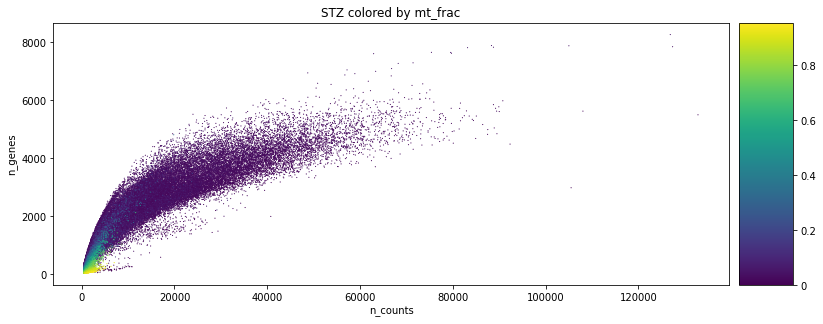

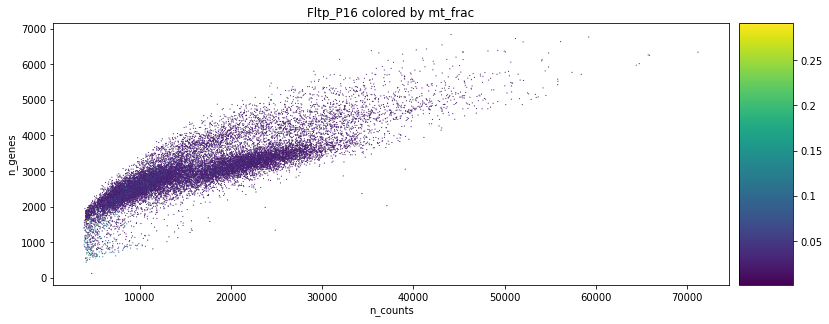

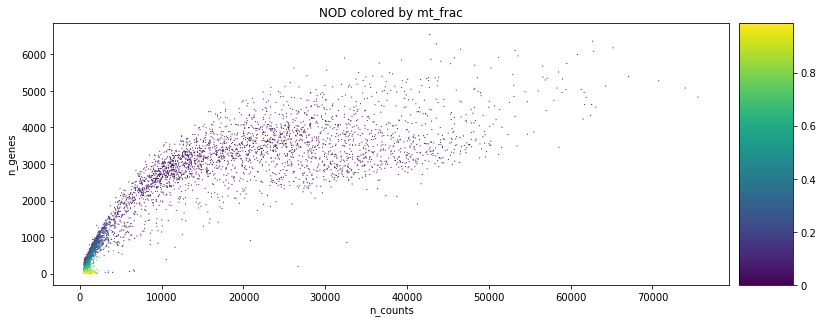

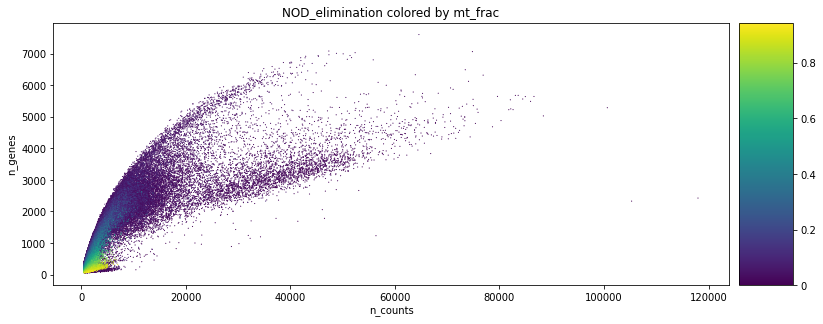

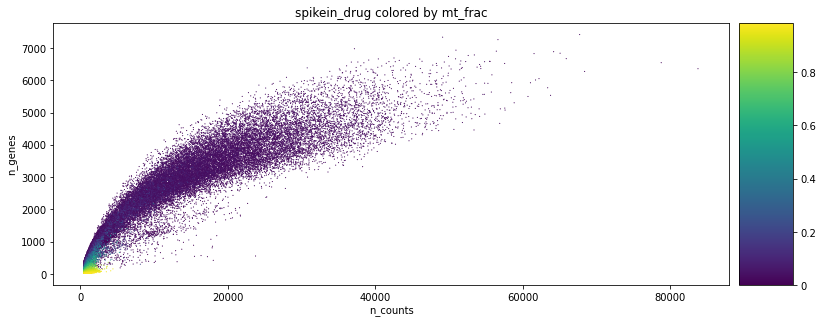

In [61]:
rcParams['figure.figsize']=(10,5)
for idx,(study,adata) in enumerate(adatas.items()):
    p1=sc.pl.scatter(adata, 'n_counts', 'n_genes', color='mt_frac', size=5,
                     show=False,sort_order=False)
    p1.set_title(study+' colored by mt_frac')
del adata

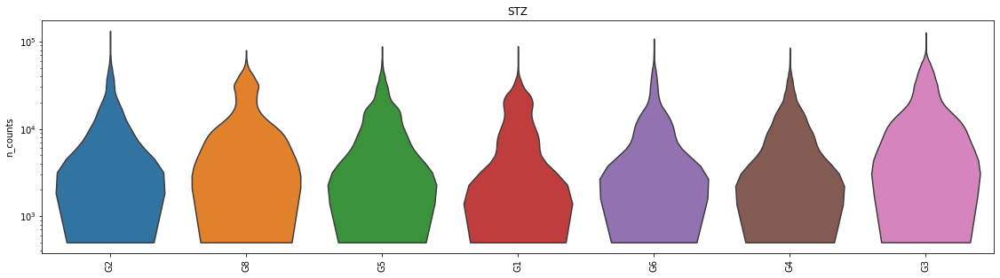

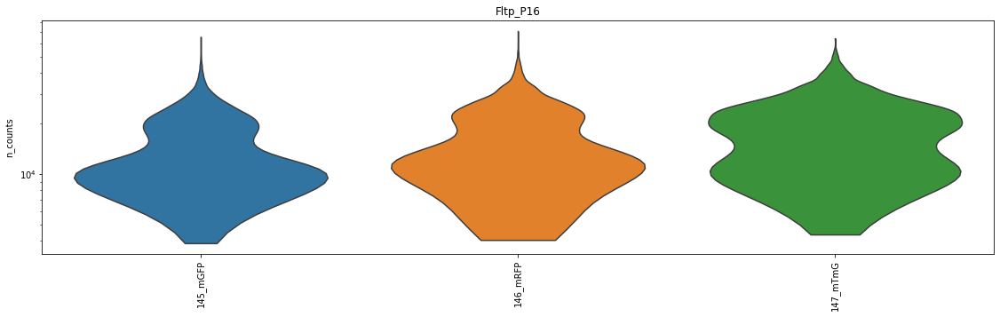

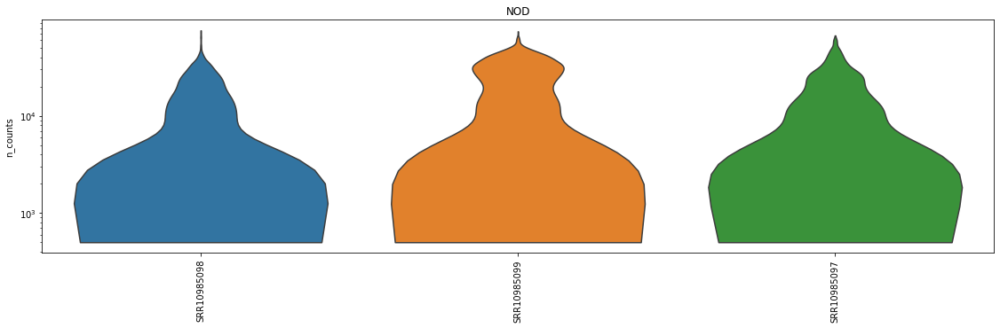

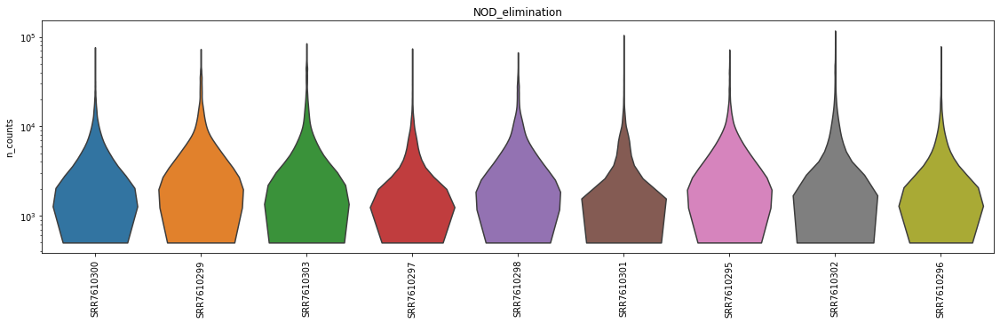

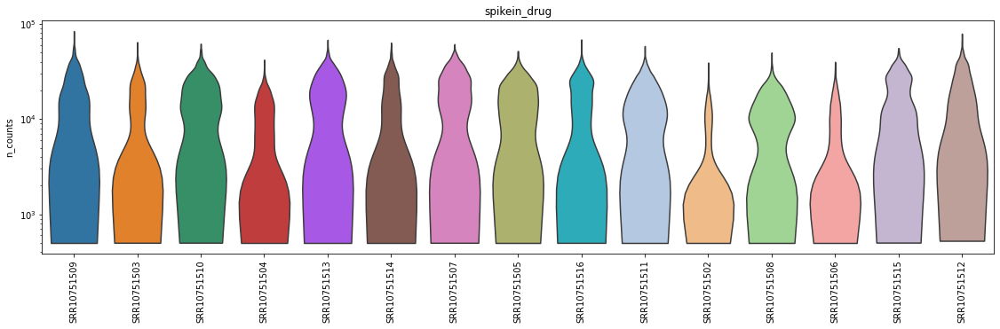

In [54]:
rcParams['figure.figsize']=(15,5)
for idx,(study,adata) in enumerate(adatas.items()):
    p1=sc.pl.violin(adata, ['n_counts'], groupby='sample', size=1, log=True,
                    rotation=90,show=False,stripplot=False)
    p1.set_title(study)
del adata

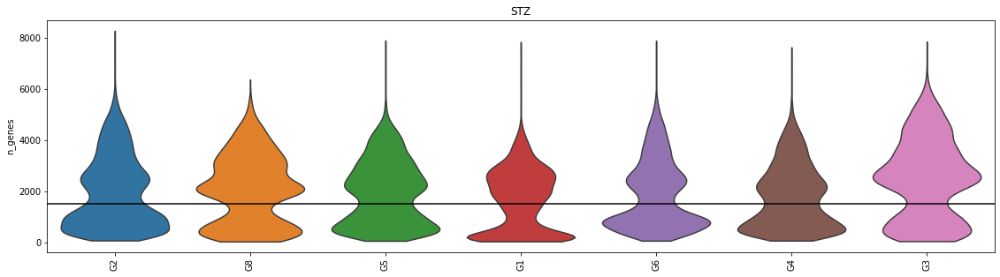

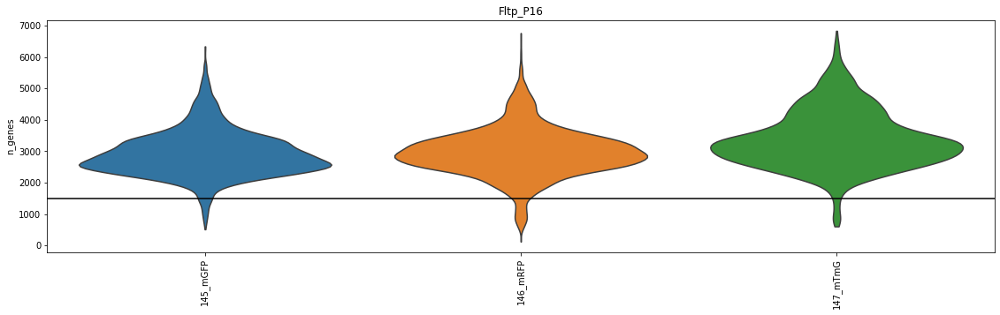

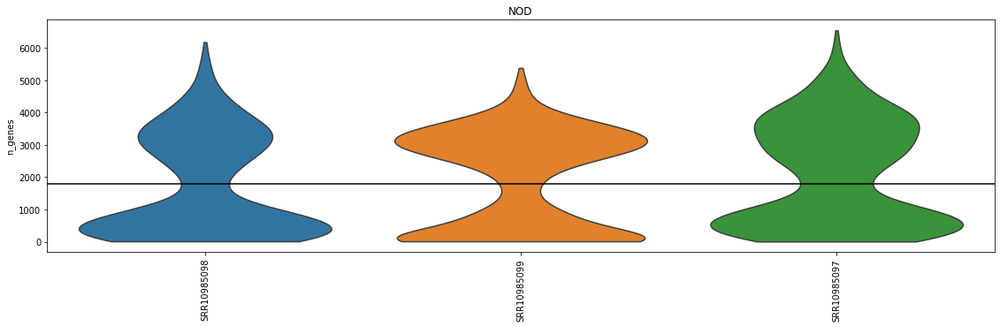

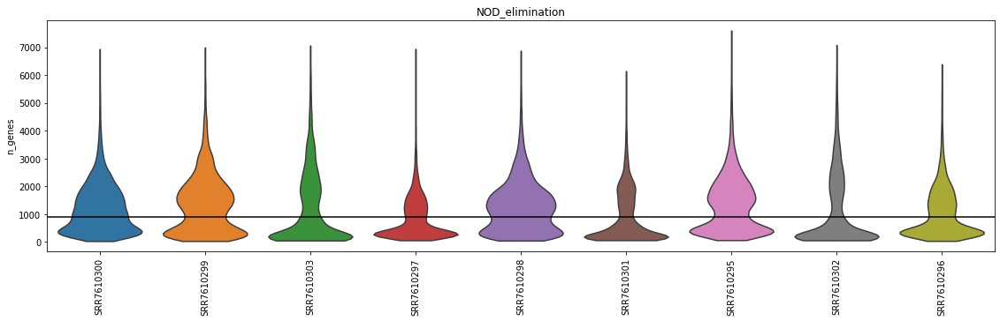

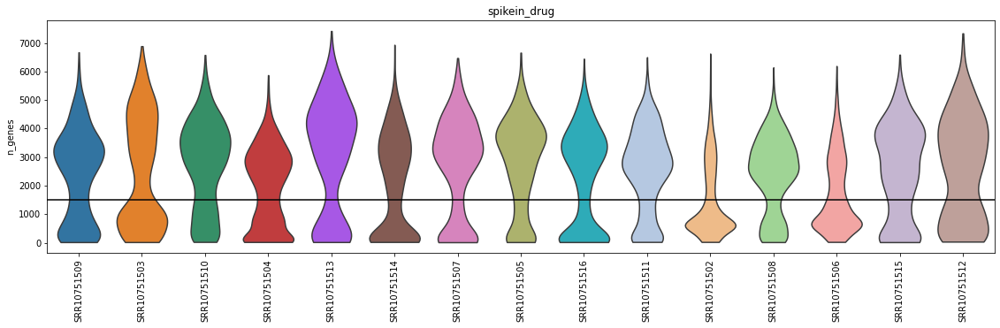

In [57]:
n_genes_min_thr={
    'STZ':1500,
    'Fltp_P16':1500,
    'NOD':1800,
    'NOD_elimination':900,
    'spikein_drug':1500
}
rcParams['figure.figsize']=(15,5)
for idx,(study,adata) in enumerate(adatas.items()):
    p1=sc.pl.violin(adata, ['n_genes'], groupby='sample', size=1, 
                    rotation=90,show=False,stripplot=False)
    p1.set_title(study)
    p1.axhline(n_genes_min_thr[study],c='k')
del adata

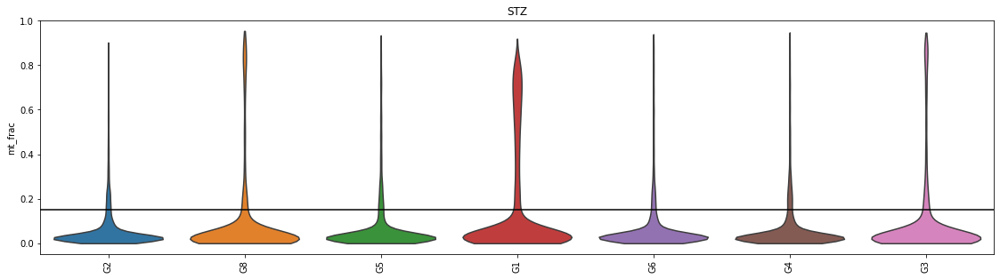

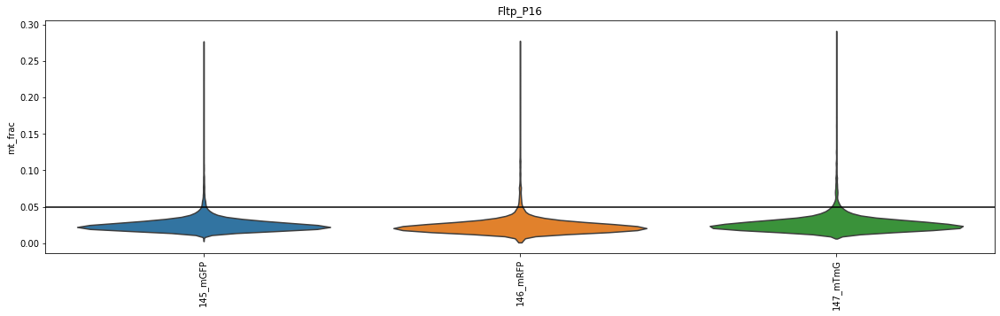

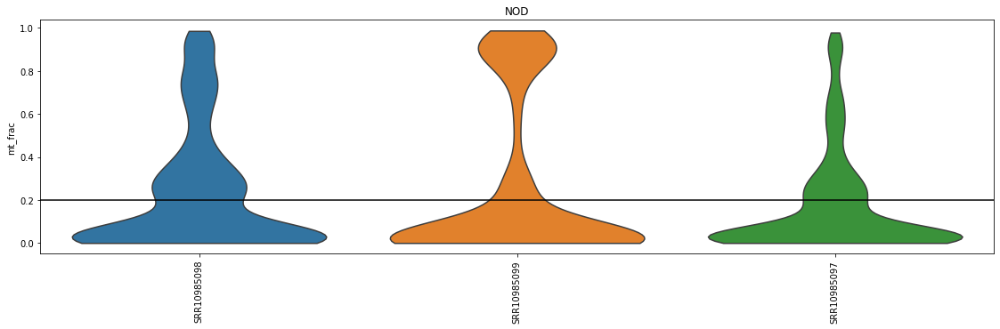

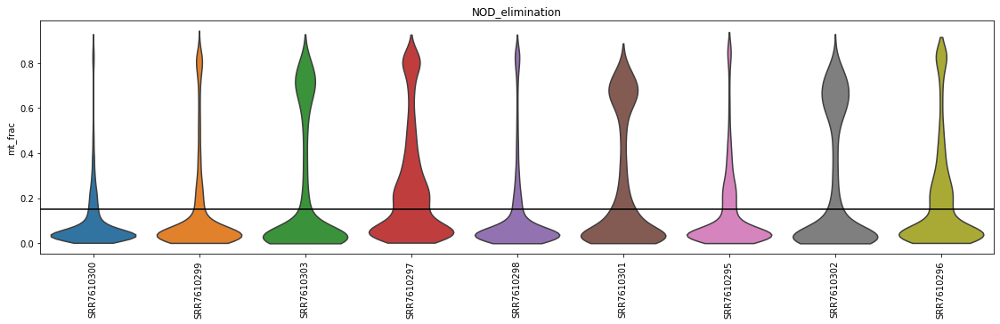

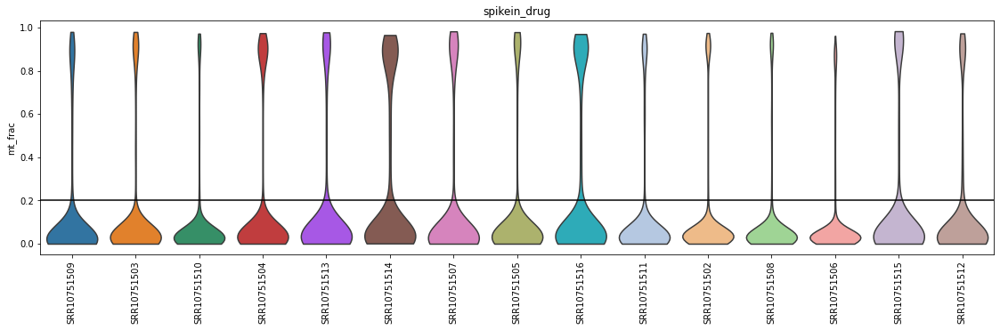

In [63]:
mt_frac_max_thr={
    'STZ':0.15,
    'Fltp_P16':0.05,
    'NOD':0.2,
    'NOD_elimination':0.15,
    'spikein_drug':0.2
}
rcParams['figure.figsize']=(15,5)
for idx,(study,adata) in enumerate(adatas.items()):
    p1=sc.pl.violin(adata, ['mt_frac'], groupby='sample', size=1, 
                    rotation=90,show=False,stripplot=False)
    p1.set_title(study)
    p1.axhline(mt_frac_max_thr[study],c='k')
del adata

Filtering

In [85]:
for study in adatas:
    print(study)
    # Filter cells according to identified QC thresholds:
    print('Total number of cells: {:d}'.format(adatas[study].n_obs))

    adatas[study] = adatas[study][adatas[study].obs['mt_frac'] <= mt_frac_max_thr[study]].copy()
    print('Number of cells after MT filter: {:d}'.format(adatas[study].n_obs))

    sc.pp.filter_cells(adatas[study], min_genes = n_genes_min_thr[study])
    print('Number of cells after min gene filter: {:d}'.format(adatas[study].n_obs))
    
    # Save raw counts with all genes
    adatas[study].raw=adatas[study].copy()
    
    #Filter genes:
    print('Total number of genes: {:d}'.format(adatas[study].n_vars))
    sc.pp.filter_genes(adatas[study], min_cells=20)
    print('Number of genes after cell filter: {:d}'.format(adatas[study].n_vars))

STZ
Total number of cells: 65375
Number of cells after MT filter: 55685
Number of cells after min gene filter: 36899
Total number of genes: 31253
Number of genes after cell filter: 17804
Fltp_P16
Total number of cells: 21293
Number of cells after MT filter: 20774
Number of cells after min gene filter: 20553
Total number of genes: 31125
Number of genes after cell filter: 16771
NOD
Total number of cells: 5181
Number of cells after MT filter: 3346
Number of cells after min gene filter: 2729
Total number of genes: 31253
Number of genes after cell filter: 13783
NOD_elimination
Total number of cells: 116474
Number of cells after MT filter: 73638
Number of cells after min gene filter: 53508
Total number of genes: 31253
Number of genes after cell filter: 18679
spikein_drug
Total number of cells: 41249
Number of cells after MT filter: 35118
Number of cells after min gene filter: 24275
Total number of genes: 31253
Number of genes after cell filter: 17469


In [86]:
# Summary after filtering
for study,adata in adatas.items():
    print(study,'shape:',adata.shape)
    # Summary statistics per file/batch
    df = adata.obs[['n_genes','n_counts','mt_frac','sample']]
    df_all = pd.DataFrame(index=df['sample'].unique())
    for obs in ['n_genes','n_counts','mt_frac']:
        df_all['min_'+obs]=df.groupby(by='sample')[obs].min()
        df_all['max_'+obs]=df.groupby(by='sample')[obs].max()
        df_all['mean_'+obs]=df.groupby(by='sample')[obs].mean()
        df_all['median_'+obs]=df.groupby(by='sample')[obs].median()
    display(df_all)
del adata

STZ shape: (36899, 17804)


,min_n_genes,max_n_genes,mean_n_genes,median_n_genes,min_n_counts,max_n_counts,mean_n_counts,median_n_counts,min_mt_frac,max_mt_frac,mean_mt_frac,median_mt_frac
G2,1500,8266,3032.762416,2820.0,2893.0,132826.0,19766.052734,14849.0,0.000673,0.149366,0.025413,0.021949
G8,1501,6359,2875.537813,2751.0,2852.0,79861.0,20338.933594,15767.0,0.000742,0.138136,0.021066,0.017965
G5,1500,7887,2836.493636,2695.0,2926.0,88320.0,17984.015625,14929.0,0.000078,0.148432,0.025291,0.021726
G1,1500,7829,2584.548787,2528.0,2932.0,88748.0,18244.164062,17490.0,0.005756,0.149567,0.028399,0.024155
G6,1500,7879,2965.191996,2736.0,2919.0,108027.0,19188.101562,14009.0,0.000083,0.149581,0.027149,0.023537
G4,1500,7622,2758.810118,2580.5,2808.0,85051.0,16623.900391,13460.0,0.000420,0.148430,0.025023,0.021656
G3,1501,7847,3312.286353,3079.0,2792.0,127350.0,23305.582031,17610.5,0.001327,0.146013,0.023803,0.019945


Fltp_P16 shape: (20553, 16771)


,min_n_genes,max_n_genes,mean_n_genes,median_n_genes,min_n_counts,max_n_counts,mean_n_counts,median_n_counts,min_mt_frac,max_mt_frac,mean_mt_frac,median_mt_frac
145_mGFP,1509,6341,2959.385872,2840,3892.0,65752.0,15316.524414,13026.0,0.006127,0.049971,0.024391,0.023519
146_mRFP,1513,6766,3028.472732,2955,4039.0,71209.0,16948.833984,14759.0,0.001682,0.049786,0.022507,0.021718
147_mTmG,1545,6836,3417.790558,3263,4475.0,64439.0,19993.246094,19428.0,0.009670,0.049932,0.025087,0.024169


NOD shape: (2729, 13783)


,min_n_genes,max_n_genes,mean_n_genes,median_n_genes,min_n_counts,max_n_counts,mean_n_counts,median_n_counts,min_mt_frac,max_mt_frac,mean_mt_frac,median_mt_frac
SRR10985098,1800,6177,3348.640823,3289.5,4234.0,75573.0,19117.171875,16998.0,0.001180,0.171259,0.026224,0.022061
SRR10985099,1829,5379,3143.247756,3130.5,3713.0,74020.0,27350.550781,27761.5,0.000583,0.120085,0.019138,0.016496
SRR10985097,1802,6541,3488.429298,3471.0,4558.0,67082.0,20825.468750,17952.0,0.000298,0.181213,0.029184,0.023100


NOD_elimination shape: (53508, 18679)


,min_n_genes,max_n_genes,mean_n_genes,median_n_genes,min_n_counts,max_n_counts,mean_n_counts,median_n_counts,min_mt_frac,max_mt_frac,mean_mt_frac,median_mt_frac
SRR7610300,900,6941,1838.703402,1677,1436.0,76875.0,7096.793945,4663.0,0.002947,0.149897,0.042352,0.034567
SRR7610299,900,6997,2024.875382,1826,1525.0,73382.0,9597.723633,5598.0,0.003899,0.149576,0.041010,0.033944
SRR7610303,900,7068,2421.060947,2204,1413.0,84944.0,12320.862305,6478.5,0.000760,0.149835,0.034366,0.025598
SRR7610297,900,6944,1700.013671,1523,1461.0,74387.0,7553.584473,5254.0,0.009435,0.149949,0.056137,0.044804
SRR7610298,900,6878,1870.292636,1668,1480.0,67327.0,8612.670898,5385.0,0.002649,0.149855,0.043079,0.035360
SRR7610301,901,6150,1986.277997,1865,1456.0,105286.0,7650.763184,5722.5,0.000796,0.149644,0.040459,0.027764
SRR7610295,900,7609,2042.872451,1860,1477.0,72367.0,7842.879395,5143.5,0.001452,0.149982,0.043832,0.034921
SRR7610302,900,7086,2532.125230,2349,1518.0,117985.0,12429.051758,7485.0,0.000328,0.149956,0.035806,0.025113
SRR7610296,900,6394,1855.064179,1690,1485.0,78663.0,7290.785645,4786.0,0.002483,0.149662,0.043773,0.034373


spikein_drug shape: (24275, 17469)


,min_n_genes,max_n_genes,mean_n_genes,median_n_genes,min_n_counts,max_n_counts,mean_n_counts,median_n_counts,min_mt_frac,max_mt_frac,mean_mt_frac,median_mt_frac
SRR10751509,1501,6670,3312.341163,3260.5,4055.0,83780.0,21826.396484,19314.0,0.000866,0.185185,0.024994,0.022866
SRR10751503,1502,6885,3968.618019,4020.0,3131.0,64197.0,19407.679688,18667.0,0.001236,0.174352,0.030577,0.027164
SRR10751510,1500,6575,3482.740563,3473.0,3832.0,61743.0,20645.166016,19600.0,0.001382,0.162291,0.029549,0.026848
SRR10751504,1501,5870,2930.205962,2887.0,3070.0,42011.0,13647.039062,13093.0,0.001460,0.195713,0.033376,0.029671
SRR10751513,1508,7416,4093.172967,4121.0,3393.0,67728.0,22009.896484,20820.0,0.002789,0.188727,0.036008,0.031407
SRR10751514,1501,6932,3331.199222,3310.0,3213.0,63390.0,20708.425781,19261.0,0.003164,0.190421,0.037448,0.032880
SRR10751507,1516,6469,3587.169048,3494.5,3560.0,61057.0,23743.982422,23102.0,0.001623,0.125835,0.028216,0.025171
SRR10751505,1504,6657,3541.804304,3612.0,3365.0,51671.0,18979.583984,18341.0,0.000390,0.196236,0.035131,0.032263
SRR10751516,1520,6443,3412.966461,3383.0,2921.0,68401.0,21385.191406,21347.0,0.001114,0.194145,0.036847,0.032611
SRR10751511,1504,6498,3224.353553,3102.0,3531.0,58382.0,17471.333984,15996.0,0.002726,0.130648,0.030619,0.027663


## Normalise

In [87]:
# Normalise, log1p and HVG
for adata in adatas.values():
    sc.pp.normalize_total(adata, target_sum=1e6, exclude_highly_expressed=True)
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata, flavor='cell_ranger', 
                                batch_key='sample',n_top_genes =2000)
del adata

... storing 'leiden_r1_normscl' as categorical
... storing 'design' as categorical
... storing 'age' as categorical
... storing 'sex' as categorical
/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
... storing 'leiden_r1_normscl' as categorical
... storing 'design' as categorical
... storing 'age' as categorical
... storing 'sex' as categorical
/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returnin

In [92]:
# Combine adatas
adata=ann.AnnData.concatenate( *adatas.values(),  batch_key = 'study', 
                                    batch_categories = list(adatas.keys())).copy()    

In [102]:
adata

AnnData object with n_obs × n_vars = 137964 × 13520
    obs: 'leiden_r1_normscl', 'design', 'age', 'sex', 'sample', 'n_counts', 'n_genes', 'mt_frac', 'study'
    var: 'gene_symbol-Fltp_P16', 'n_cells-Fltp_P16', 'highly_variable-Fltp_P16', 'means-Fltp_P16', 'dispersions-Fltp_P16', 'dispersions_norm-Fltp_P16', 'highly_variable_nbatches-Fltp_P16', 'highly_variable_intersection-Fltp_P16', 'gene_symbol-NOD', 'n_cells-NOD', 'highly_variable-NOD', 'means-NOD', 'dispersions-NOD', 'dispersions_norm-NOD', 'highly_variable_nbatches-NOD', 'highly_variable_intersection-NOD', 'gene_symbol-NOD_elimination', 'n_cells-NOD_elimination', 'highly_variable-NOD_elimination', 'means-NOD_elimination', 'dispersions-NOD_elimination', 'dispersions_norm-NOD_elimination', 'highly_variable_nbatches-NOD_elimination', 'highly_variable_intersection-NOD_elimination', 'gene_symbol-STZ', 'n_cells-STZ', 'highly_variable-STZ', 'means-STZ', 'dispersions-STZ', 'dispersions_norm-STZ', 'highly_variable_nbatches-STZ', 'highly_v

In [108]:
# Add across study sample anno
adata.obs['study_sample']=adata.obs.apply(lambda x: x['study']+'_'+x['sample'],axis=1)

In [133]:
# Add gene symbol info
adata.var['gene_symbol']=eid_mapping.loc[adata.var_names,'gene_symbol']
adata.raw.var['gene_symbol']=eid_mapping.loc[adata.raw.var_names,'gene_symbol']

## Cell type annotation

In [109]:
# Prepare anno data
adata_scl=adata.copy()
# HVG on samples
sc.pp.highly_variable_genes(adata_scl, flavor='cell_ranger', 
                                batch_key='study_sample',n_top_genes =2000)
# Scale for dim red
sc.pp.scale(adata_scl,max_value=10)

... storing 'leiden_r1_normscl' as categorical
... storing 'design' as categorical
... storing 'age' as categorical
... storing 'sex' as categorical
... storing 'sample' as categorical
... storing 'study_sample' as categorical
/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


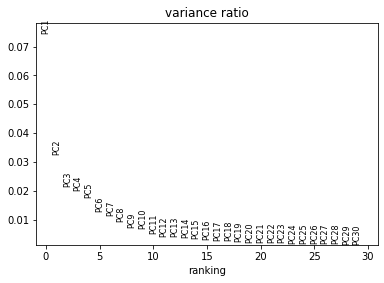

In [110]:
# PCA
sc.pp.pca(adata_scl, n_comps=30, use_highly_variable=True, svd_solver='arpack')
rcParams['figure.figsize']=(6,4)
sc.pl.pca_variance_ratio(adata_scl)

In [111]:
# Neighbours and UMAP
sc.pp.neighbors(adata_scl,n_pcs = 11) 
sc.tl.umap(adata_scl)

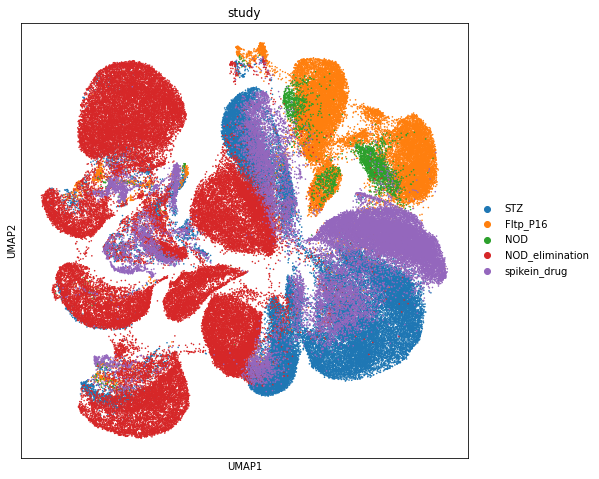

In [203]:
rcParams['figure.figsize']=(8,8)
sc.pl.umap(adata_scl,color='study',s=10)

In [140]:
# Prepare adata for gene plotting - raw normalised and add embedding info
adata_scl_rn=adata.raw.to_adata()
adata_scl_rn.obsm['X_umap']=adata_scl.obsm['X_umap']
adata_scl_rn.obsm['X_pca']=adata_scl.obsm['X_pca']
adata_scl_rn.uns['neighbors']=adata_scl.uns['neighbors']
adata_scl_rn.obsp['connectivities']=adata_scl.obsp['connectivities']
sc.pp.normalize_total(adata_scl_rn, target_sum=1e6, exclude_highly_expressed=True)
sc.pp.log1p(adata_scl_rn)

Marker genes

('B cell', 'NA')
Missing genes: []


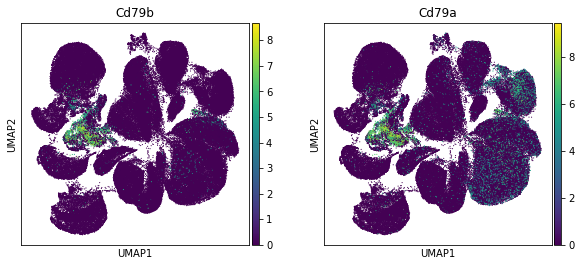

('Schwann cell', 'NA')
Missing genes: []


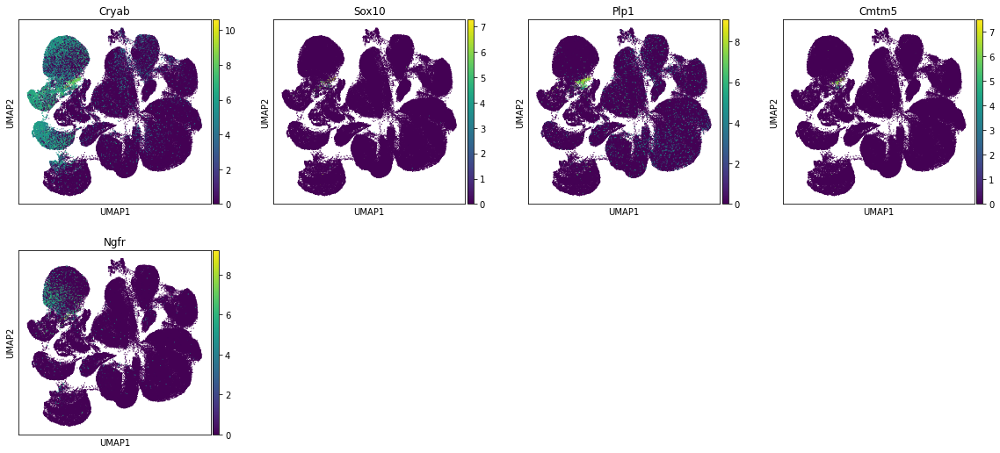

('T cell', 'NA')
Missing genes: []


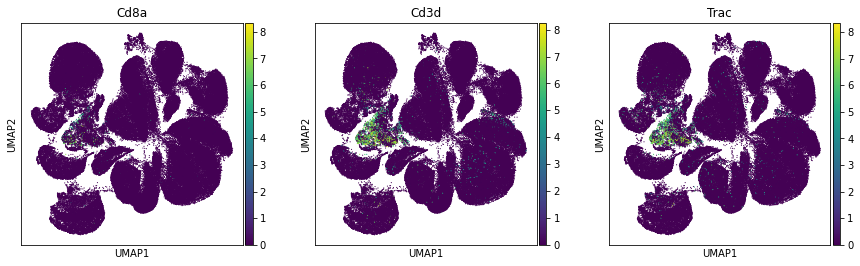

('cytotoxic T cell', 'NA')
Missing genes: []


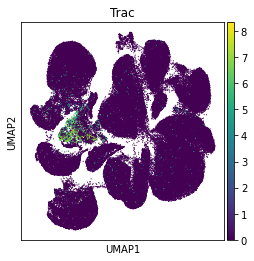

('dendritic cell', 'NA')
Missing genes: []


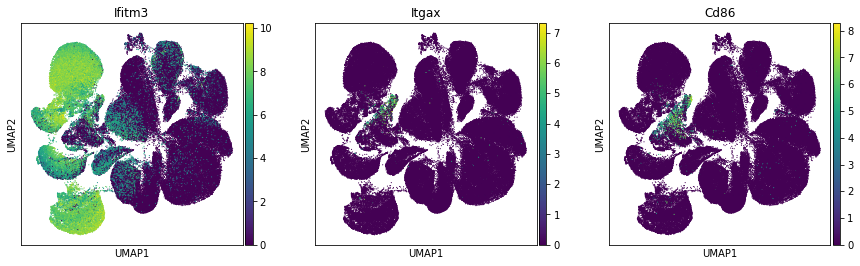

('endothelial cell', 'NA')
Missing genes: []


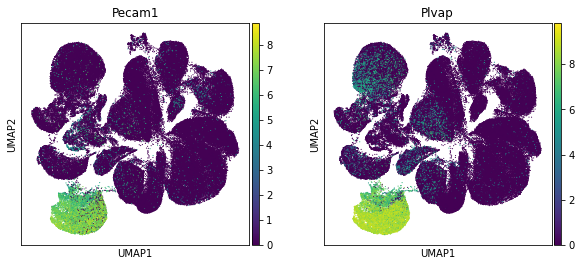

('leukocyte', 'NA')
Missing genes: []


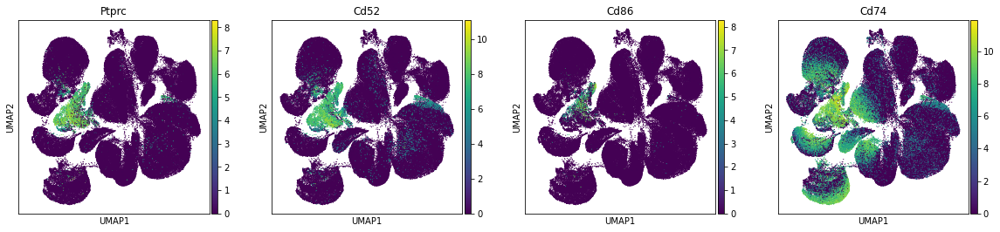

('macrophage', 'NA')
Missing genes: []


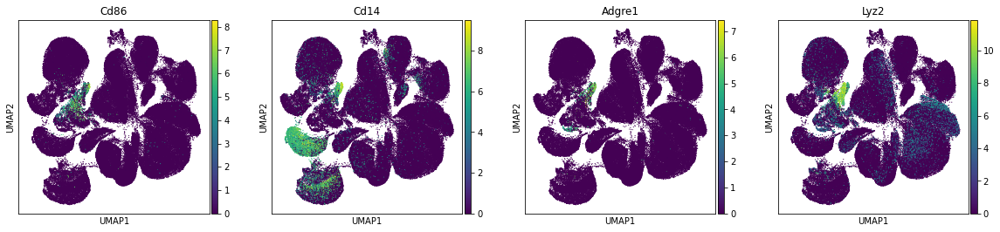

('pancreatic A cell', 'NA')
Missing genes: []


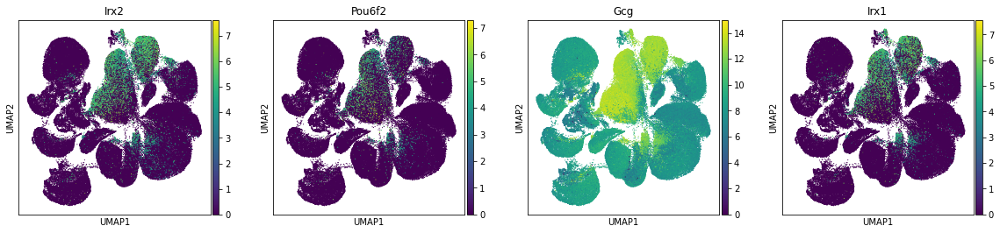

('pancreatic D cell', 'NA')
Missing genes: []


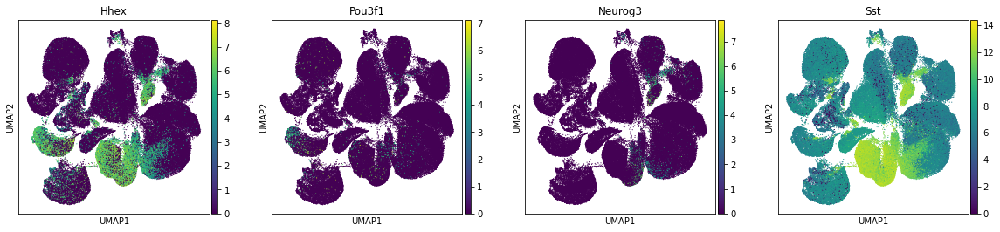

('pancreatic PP cell', 'NA')
Missing genes: []


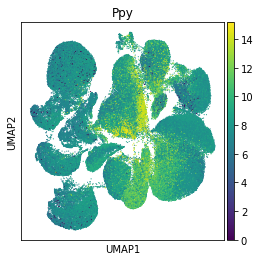

('pancreatic acinar cell', 'NA')
Missing genes: []


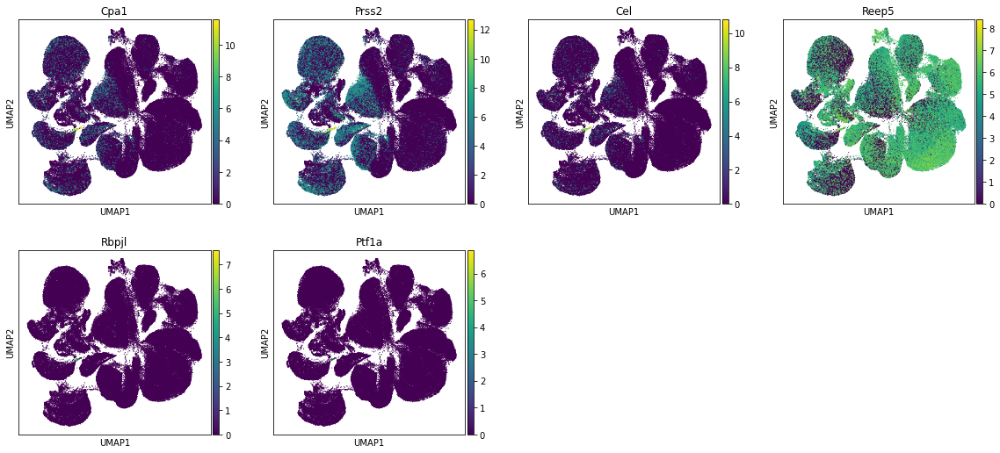

('pancreatic ductal cell', 'NA')
Missing genes: []


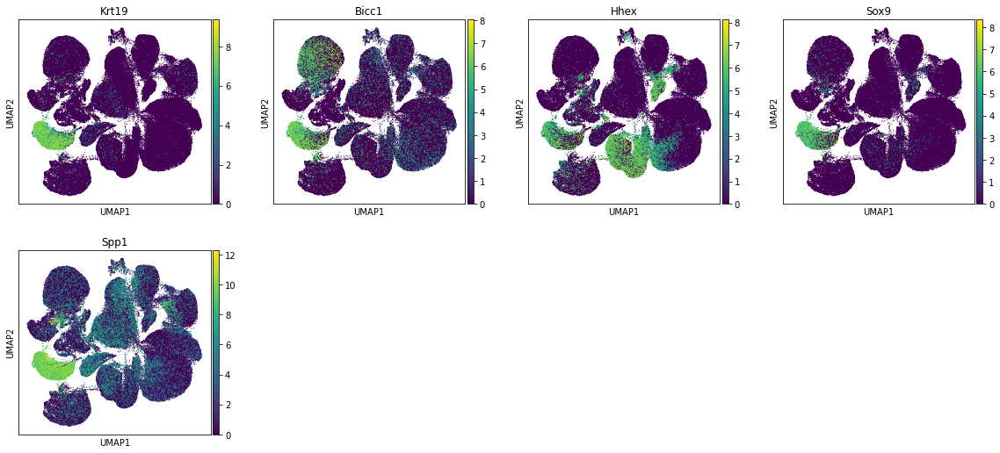

('pancreatic ductal cell', 'mature')
Missing genes: []


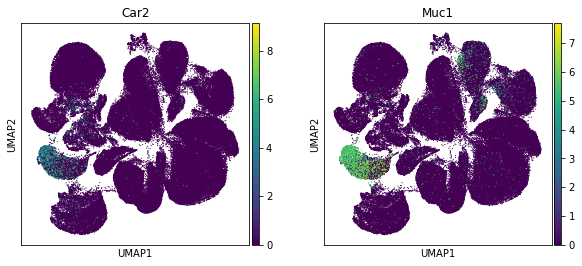

('pancreatic endocrine cell', 'NA')
Missing genes: []


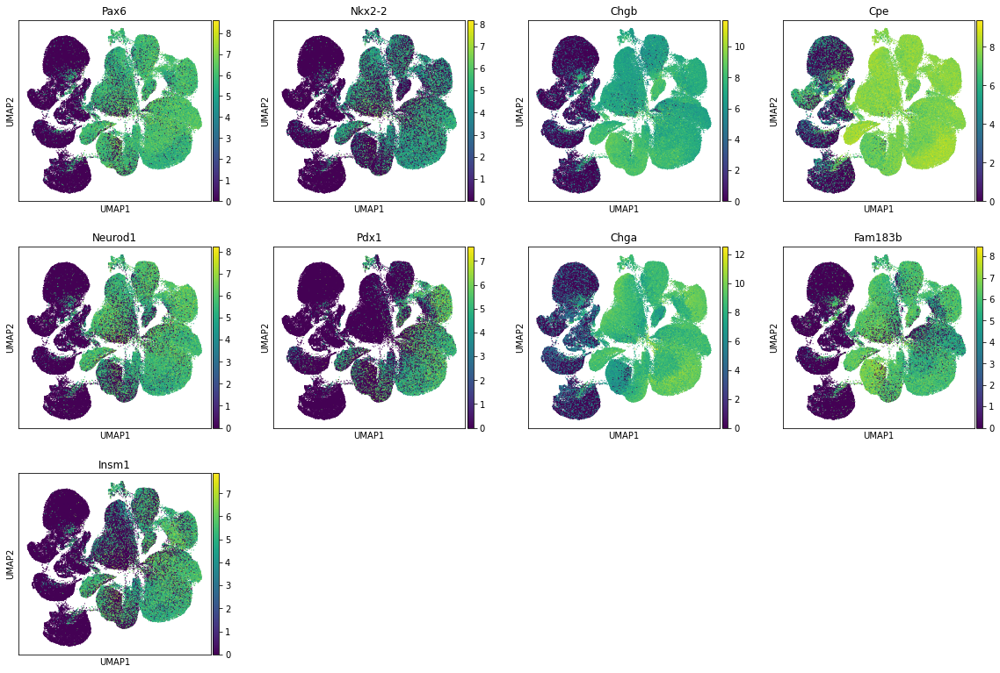

('pancreatic epsilon cell', 'NA')
Missing genes: []


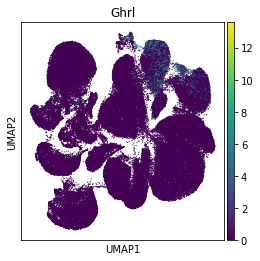

('pancreatic stellate cell', 'NA')
Missing genes: []


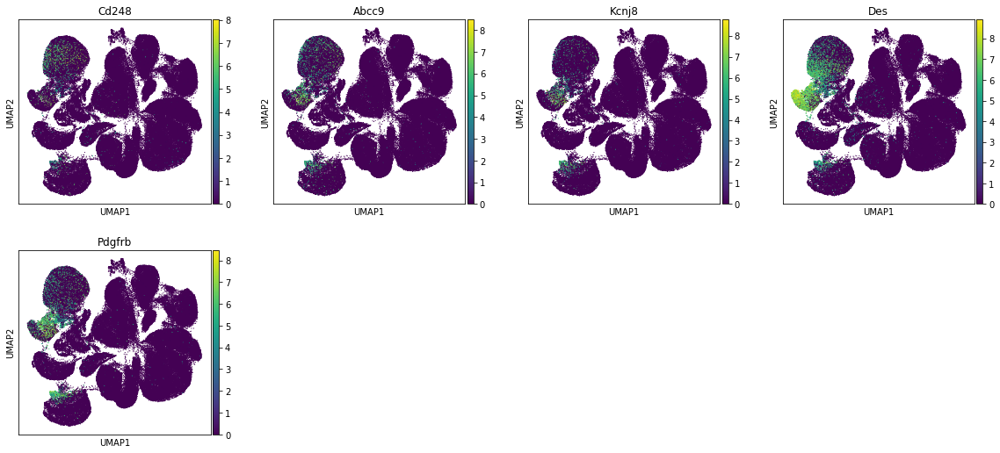

('pancreatic stellate cell', 'activated')
Missing genes: []


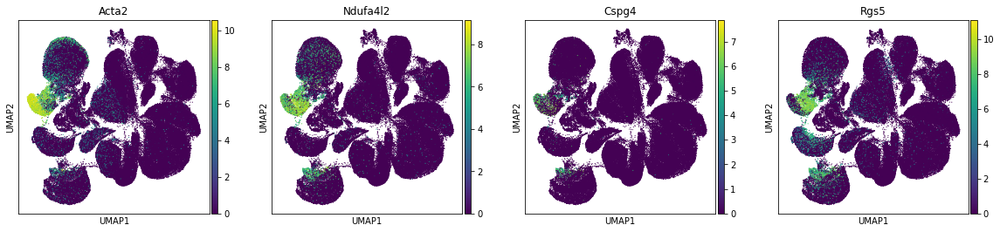

('pancreatic stellate cell', 'quiescent')
Missing genes: []


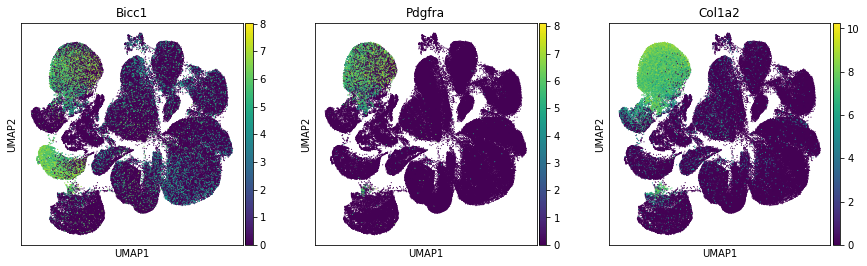

('progenitor cell of endocrine pancreas', 'NA')
Missing genes: []


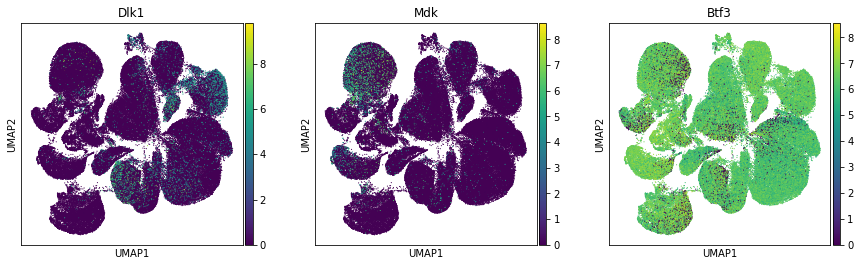

('proliferative', 'NA')
Missing genes: []


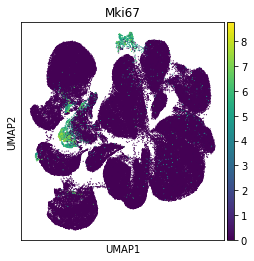

('type B pancreatic cell', 'NA')
Missing genes: []


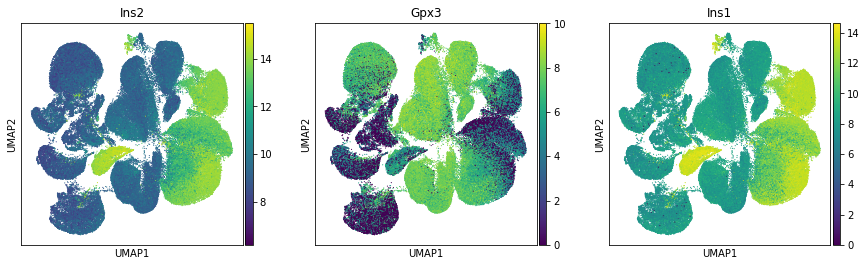

In [208]:
# Plot markers
marker_data=pd.read_excel('/home/icb/karin.hrovatin/marker_genes_collection.xlsx',
                          sheet_name='Collection table')
# Add proliferative info
marker_data=marker_data.append(pd.Series({'gene_name':'Mki67','tissue':'pancreas','organism':'Mus musculus',
                    'cell_type':'proliferative'}),ignore_index=True)
# Plot markers for each cell type of mouse pancreas
# Fillna as else groupby item iteration does not work well
marker_groups=marker_data.fillna('NA').query(
    'tissue=="pancreas" & organism =="Mus musculus"').groupby(['cell_type','subtype'])
genes_all=set(adata_scl_rn.var.gene_symbol.tolist())
for cell_type,data in marker_groups:
    # Omit beta cell subtype anno
    if not (cell_type[0]=='type B pancreatic cell' and  cell_type[1]!="NA"):
        print(cell_type)
        # For mouse subset to markers that worked
        genes=set(data.query('worked==worked & organism=="Mus musculus"').gene_name) #
        # Retain genes present in data
        missing=[gene for gene in genes if gene not in genes_all]
        genes=[gene for gene in genes if gene in genes_all]
        if len(genes)>0:
            print('Missing genes:',missing)
            rcParams['figure.figsize']=(4,4)
            sc.pl.umap(adata_scl_rn, color=genes ,size=5, gene_symbols='gene_symbol',
                       sort_order=False)
        else:
            print('No availiable genes (out of:',missing,')\n')

Clusters for cell type anno

In [192]:
res=1

In [193]:
# Make clusters
sc.tl.leiden(adata_scl_rn,resolution=res,key_added='leiden_'+str(res))

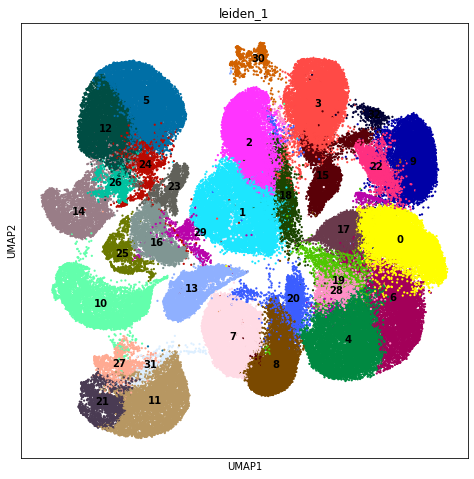

In [201]:
# Clusters
rcParams['figure.figsize']=(8,8)
sc.pl.umap(adata_scl_rn,color='leiden_1',legend_loc='on data',s=20)

In [246]:
# Subcluster large clusters
cl_col='leiden_1'
adata_scl_rn.obs['cl_sub']=adata_scl_rn.obs[cl_col].astype('str').copy()
subcluster=['10','1','3','4','29','15','24']
for cl in adata_scl_rn.obs[cl_col].unique():
    if cl in subcluster:
        adata_temp=adata_scl_rn[adata_scl_rn.obs[cl_col]==cl,:].copy()
        sc.pp.neighbors(adata_temp,n_pcs = 11) 
        sc.tl.leiden(adata_temp,resolution=0.3)
        adata_scl_rn.obs.loc[adata_temp.obs_names,'cl_sub']=[
            cl+'_'+c for c in adata_temp.obs['leiden']]

... storing 'cl_sub' as categorical


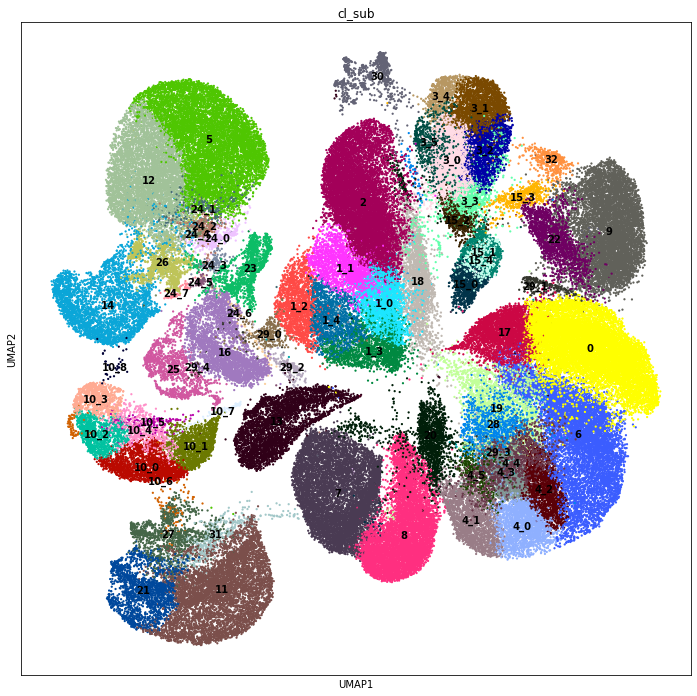

In [247]:
# Subclusters
rcParams['figure.figsize']=(12,12)
sc.pl.umap(adata_scl_rn,color='cl_sub',legend_loc='on data',s=20)

{'mainplot_ax': <AxesSubplot:>,
 'color_legend_ax': <AxesSubplot:title={'center':'Median expression\nin group'}>}

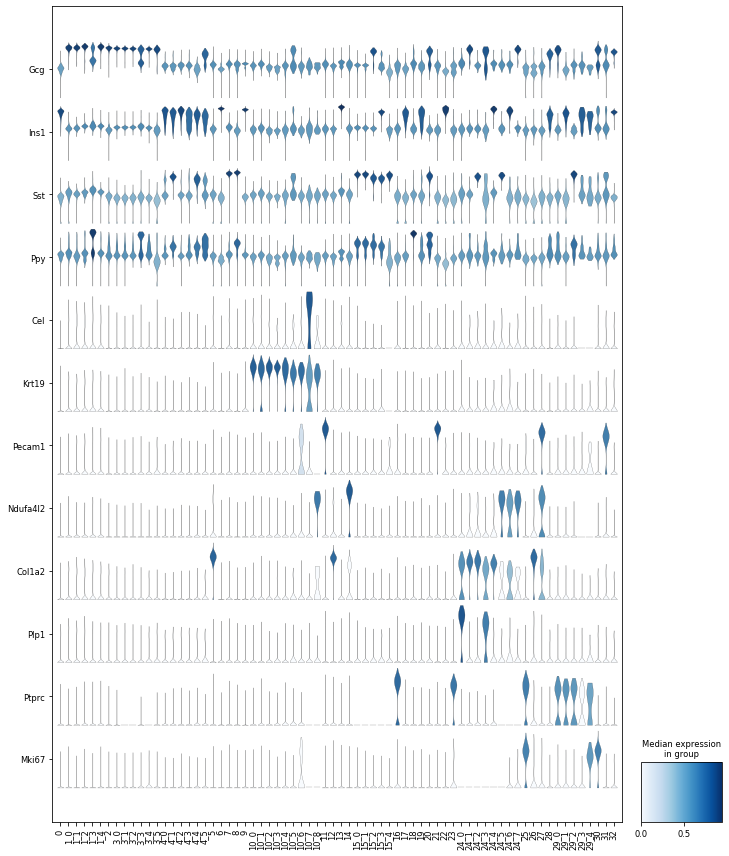

In [249]:
# Distn of ct markers across clusters
marker_map={
           'alpha':'Gcg',
           'beta':'Ins1',
           'delta':'Sst',
           'gamma':'Ppy',
           'acinar':'Cel',
           'ductal':'Krt19',
           'endothelial':'Pecam1',
           'stellate_activated':'Ndufa4l2',
           'stellate_quiescent':'Col1a2',
           'schwann':'Plp1',
           'immune':'Ptprc',
           'proliferative':'Mki67',
           }
sc.pl.stacked_violin(adata_scl_rn,var_names=list(marker_map.values()),
                groupby='cl_sub',show=False,rotation=90,gene_symbols='gene_symbol',
                swap_axes=True,standard_scale='var',figsize=(12,15))

In [255]:
# Ct-cl mapping
ct_anno={'alpha':['1_0','1_1','1_2','1_4','2','3_0','3_1','3_2','3_4','3_5'],
        'beta':['0','4_0','4_2','4_3','6','9','13','19','17','29_3','22'],
        'delta':['7','8','15_0','15_1','15_4'],
        'gamma':['1_3','3_3','18'],
        'alpha_beta':['32','28'],
        'alpha_beta_delta':['4_5'],
        'alpha_delta':['15_2','20'],
        'beta_delta':['4_1','4_4','15_3'],
        'alpha_immune':['29_0'],
        'beta_immune':['29_1'],
        'delta_immune':['29_2'],
        'endocrine_proliferative':['30'],
        'acinar':['10_7'],
        'ductal':['10_0','10_1','10_2','10_3','10_4','10_5'],
        'ductal_stellate':['10_8'],
        'endothelial':['11','21','31'],
        'endothelial_stellate':['27'],
        'ductal_endothelial':['10_6'],
        'immune':['16','23'],
        'immune_proliferative':['25','29_4'],
        'schwann':['24_0','24_3'],
        'stellate_activated':['14','24_5','24_6','24_7'],
        'stellate_quiescent':['5','12','26','24_1','24_2','24_4']}

In [256]:
# Ct-cl map for adata annotation
ct_map={}
for ct,clusters in ct_anno.items():
    for cl in clusters:
        # make sure clusters were not annotated multiple times
        if cl in ct_map:
            raise ValueError('Cluster has multiple annotations')
        else:
            ct_map[cl]=ct
if 'cell_type' in adata_scl_rn.obs.columns:
    adata_scl_rn.obs.drop('cell_type',axis=1,inplace=True)
adata_scl_rn.obs['cell_type']=adata_scl_rn.obs['cl_sub'].map(ct_map)
# Make sure all clusters were annotated
if adata_scl_rn.obs['cell_type'].isna().any():
    raise ValueError('Missing cl anno')

... storing 'cell_type' as categorical


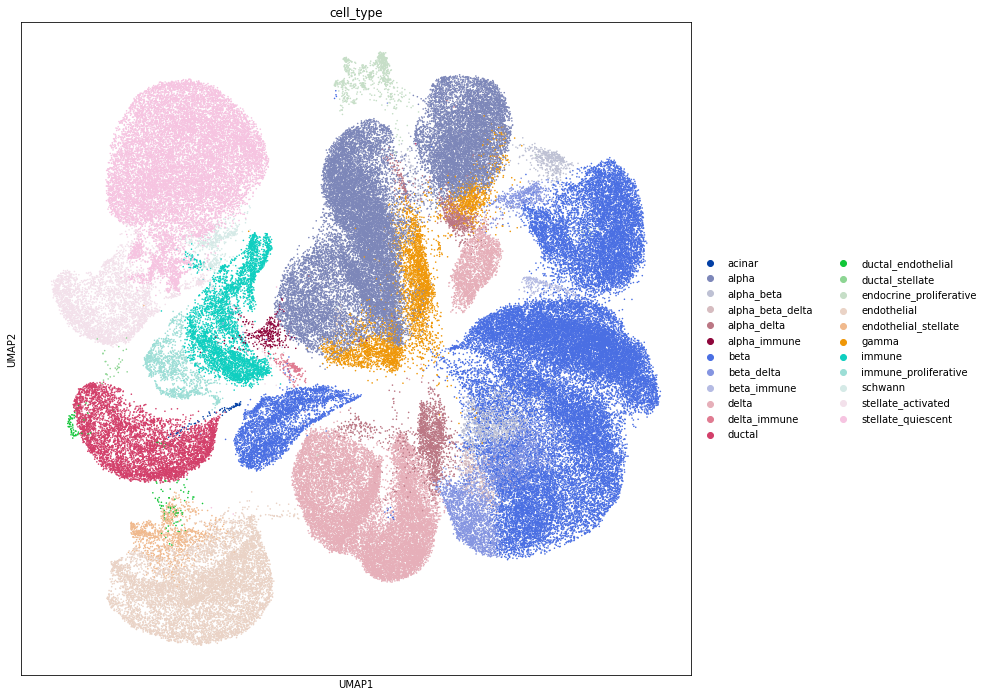

In [257]:
# Cell types
rcParams['figure.figsize']=(12,12)
sc.pl.umap(adata_scl_rn,color='cell_type',s=10)

{'mainplot_ax': <AxesSubplot:>,
 'color_legend_ax': <AxesSubplot:title={'center':'Median expression\nin group'}>}

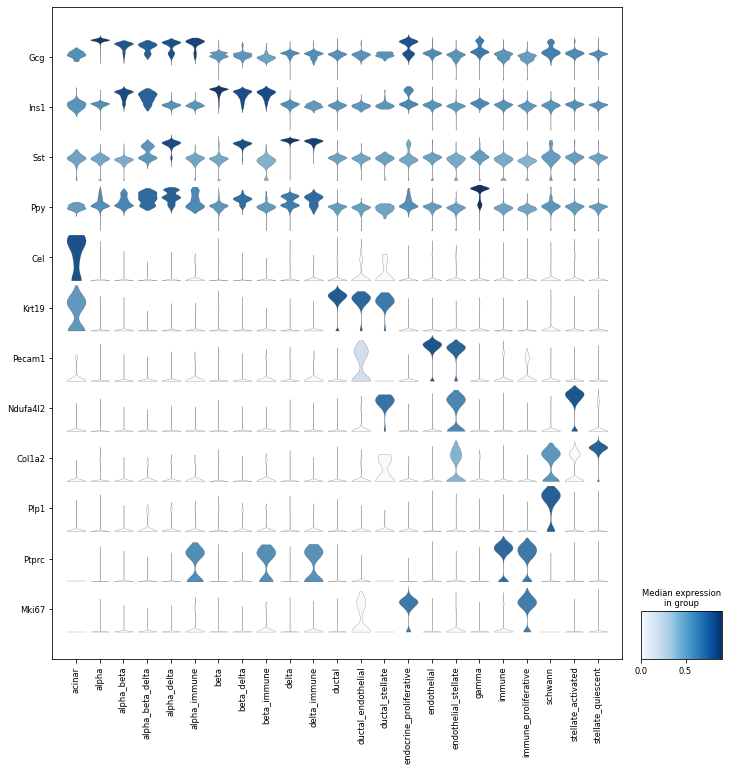

In [258]:
# markers distn on cell types
sc.pl.stacked_violin(adata_scl_rn,var_names=list(marker_map.values()),
                groupby='cell_type',show=False,rotation=90,gene_symbols='gene_symbol',
                swap_axes=True,standard_scale='var',figsize=(12,12))

In [259]:
# Add ct anno to original adata
adata.obs['cell_type']=adata_scl_rn.obs['cell_type'].copy()

<AxesSubplot:>

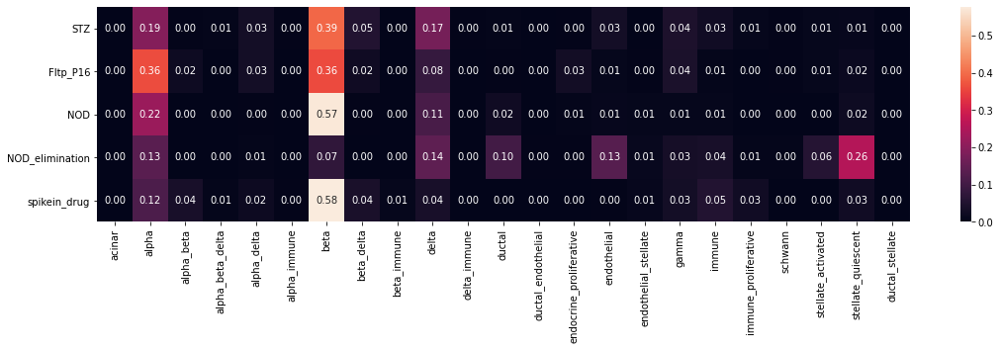

In [267]:
# ratio of each ct in each study
ct_study_ratios=pd.DataFrame()
for (study,hc),ratio in adata.obs.\
        groupby('study',observed=True)['cell_type'].\
        value_counts(normalize=True,sort=False).iteritems():
    ct_study_ratios.at[study,hc]=ratio
ct_study_ratios.fillna(0,inplace=True)
fig,ax=plt.subplots(figsize=(ct_study_ratios.shape[1]*0.8,ct_study_ratios.shape[0]*0.8))
sb.heatmap(ct_study_ratios,ax=ax,annot=True,fmt='.2f')

<AxesSubplot:>

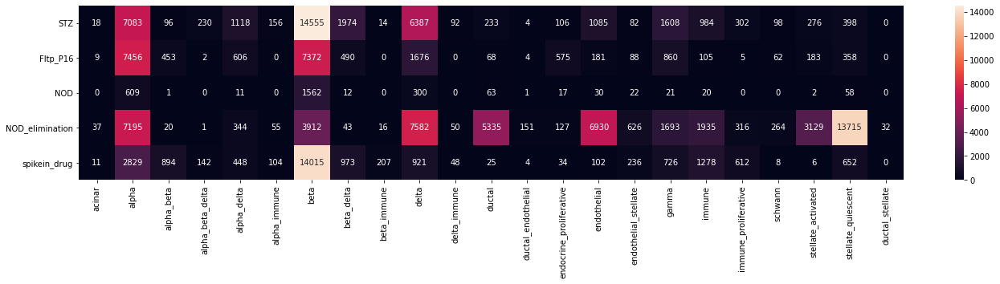

In [270]:
# Number of each ct in each study
ct_study_ratios=pd.DataFrame()
for (study,hc),ratio in adata.obs.\
        groupby('study',observed=True)['cell_type'].\
        value_counts(normalize=False,sort=False).iteritems():
    ct_study_ratios.at[study,hc]=ratio
ct_study_ratios.fillna(0,inplace=True)
fig,ax=plt.subplots(figsize=(ct_study_ratios.shape[1]*1,ct_study_ratios.shape[0]*0.8))
sb.heatmap(ct_study_ratios,ax=ax,annot=True,fmt='.0f')

## Save adata

In [261]:
adata.write(path_save+'adata_annotated.h5ad')

... storing 'leiden_r1_normscl' as categorical
... storing 'design' as categorical
... storing 'age' as categorical
... storing 'sex' as categorical
... storing 'sample' as categorical
... storing 'study_sample' as categorical
... storing 'gene_symbol' as categorical
... storing 'gene_symbol' as categorical


In [266]:
path_save+'adata_annotated.h5ad'

'/storage/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/qtr/adata_annotated.h5ad'